# *Team 4*



V. Divya Madhuri                CB.SC.U4AIE23024​

Keerthivasan S V                CB.SC.U4AIE23037 ​

Mopuru Sai Bavesh Reddy   CB.SC.U4AIE23044​

V. Bhavya Kruthi                  CB.SC.U4AIE23073      ​


We Use Landsat images to:

# 1. FLOODING IN TEXAS

*We Calculate an estimate of the flood area in Texas (in km^2). To do this you must take into account that:*
- *The different bands may not be correctly aligned. We must align them, even if manually.*
- *Do not consider the black bands in the images. They are due to a fault in the satellite sensors.*
- *We can use the humidity indices that you have at the end of this document (NDWI, ...).*

</br>

First of all, it is important to review the LANDSAT documentation.
What we are most interested in is knowing how the bands are organized and what information they will allow us to handle.

- Bands 1 - 3: These are the BGR bands
- Bands 4,5 and 7: These are Infrared bands (4 - NearIR, 5 and 7: Mid IR)
- Band 6: Thermal band. It is divided into two. Useful for temperature detection tasks, climate study, etc.
- Band 8: Panchromatic band, more detailed for tasks that require detecting more refined features.

The combination between them can serve different purposes, for example:
- The combination of 1 - 3 gives us an rgb as the image was observed in the real world.
- The combination of 4,5 or 7 with the previous ones is used in tasks to demonstrate vegetation conditions.

In [19]:
# Importing packages
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt
import copy
from inpainting_Criminisi.inpainter import Inpainter
import sys as sys
import os as os
import warnings
import pywt
from collections import Counter
from copy import copy, deepcopy
# Ignore warnings
warnings.filterwarnings("ignore")


In [20]:
# Load Bands

# August Bands
# (61 and 62 are at 512 and expand to 1014 in 61s and 62s, we keep these)
# band8 at 2048x2048, is reduced in band8s, we keep this one
august_band1 = cv2.imread("LandSat/texas/agosto_banda1.tif", 0)
august_band2 = cv2.imread("LandSat/texas/agosto_banda2.tif", 0)
august_band3 = cv2.imread("LandSat/texas/agosto_banda3.tif", 0)
august_band4 = cv2.imread("LandSat/texas/agosto_banda4.tif", 0)  # fixed typo in file name
august_band5 = cv2.imread("LandSat/texas/agosto_banda5.tif", 0)
august_band6_1 = cv2.imread("LandSat/texas/agosto_banda61s.tif", 0)
august_band6_2 = cv2.imread("LandSat/texas/agosto_banda62s.tif", 0)
august_band7 = cv2.imread("LandSat/texas/agosto_banda7.tif", 0)
august_band8 = cv2.imread("LandSat/texas/agosto_banda8s.tif", 0)

august_bands = [
    august_band1, august_band2, august_band3, august_band4, 
    august_band5, august_band6_1, august_band6_2, 
    august_band7, august_band8
]

# September Bands
# (61 and 62 are at 512 and are extended to 1014 in 61s and 62s, we keep these)
# band8 at 2048x2048, is reduced by band8s, we stay with this
september_band1 = cv2.imread("LandSat/texas/septiembre_banda1.tif",0)
september_band2 = cv2.imread("LandSat/texas/septiembre_banda2.tif",0)
september_band3 = cv2.imread("LandSat/texas/septiembre_banda3.tif",0)
september_band4 = cv2.imread("LandSat/texas/septiembre_banda4.tif",0)
september_band5 = cv2.imread("LandSat/texas/septiembre_banda5.tif",0)
september_band6_1 = cv2.imread("LandSat/texas/septiembre_banda61s.tif",0)
september_band6_2 = cv2.imread("LandSat/texas/septiembre_banda62s.tif",0)
september_band7 = cv2.imread("LandSat/texas/septiembre_banda7.tif",0)
september_band8 = cv2.imread("LandSat/texas/septiembre_banda8s.tif",0)

september_bands = [
    september_band1, september_band2, september_band3, 
    september_band4, september_band5, september_band6_1, 
    september_band6_2, september_band7, september_band8
]

# Let's see the dimensions of the images (all the selected ones have the same dimension):
print(september_band1.shape)


(1024, 1024)


(<Axes: >, <matplotlib.image.AxesImage at 0x1cdde3e1450>)

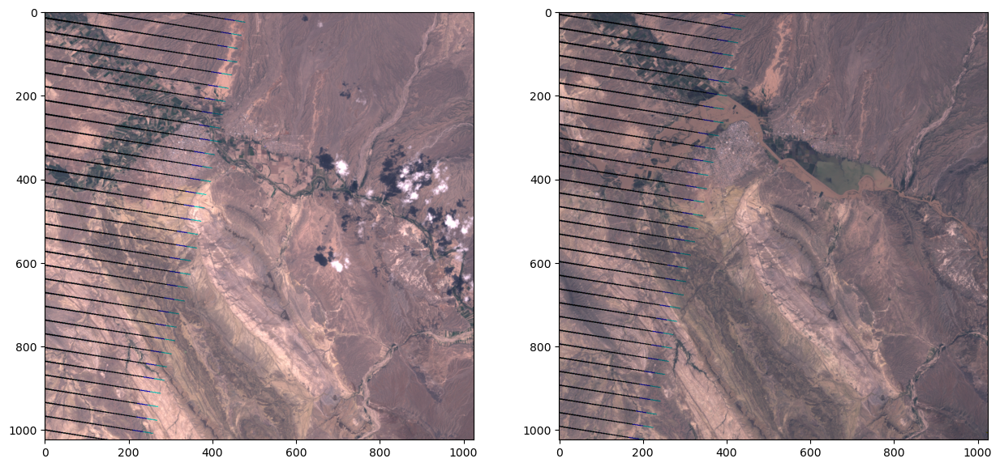

In [3]:
# We combine the bands 1-3 August and September, to see RGB

# We combine the three RGB bands of August
img_rgb_agosto = cv2.merge([august_band1, august_band2, august_band3])
# We combine the three RGB bands of September
img_rgb_septiembre = cv2.merge([september_band1, september_band2, september_band3])
# We show
plt.figure(figsize=(15,8))
plt.subplot(121), plt.imshow(cv2.cvtColor(img_rgb_agosto, cv2.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(cv2.cvtColor(img_rgb_septiembre, cv2.COLOR_BGR2RGB))


The flooding is clearly visible, but we need to preprocess the images before we can calculate the flooded area.
1. Alignment of the images: The bands for August and September are not aligned. They should be in order to make a reliable estimate.
2. Remove the black bands that are observed due to a sensor failure.


### Adjustment of the bands.

We are going to readjust the bands for August, so that they are positioned like those for September, which are the ones that contain the flooding.


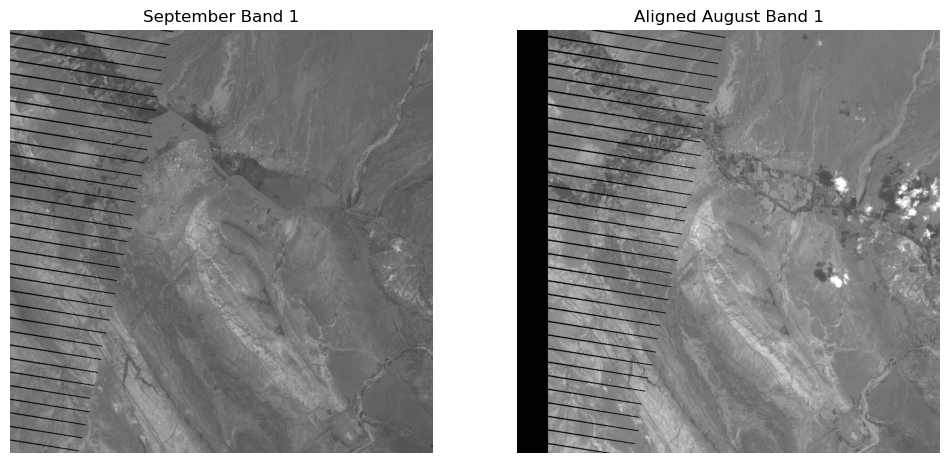

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to do the transformation manually by moving pixels
def move_pixels(img, move_pixels):
    shift = move_pixels
    rows, columns = img.shape
    shift_matrix = np.float32([[1, 0, -shift], [0, 1, 0]])  # Create shift matrix
    shifted_image = cv2.warpAffine(img, shift_matrix, (columns, rows))  # Apply the transformation
    return shifted_image

# Align August bands using manual approximation
august_bands_aligned = []
for i in range(len(august_bands)):
    august_bands_aligned.append(move_pixels(august_bands[i], -75))

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(september_bands[0], cv2.COLOR_GRAY2RGB))  # Convert grayscale to RGB for displaying
plt.title('September Band 1')
plt.axis('off')  # Hide axis
plt.subplot(122)
plt.imshow(cv2.cvtColor(august_bands_aligned[0], cv2.COLOR_GRAY2RGB))  # Convert grayscale to RGB for displaying
plt.title('Aligned August Band 1')
plt.axis('off')  # Hide axis
plt.show()


### Elimination of black lines and readjustment process.

In order to eliminate the black lines resulting from errors in the image capture by the satellite sensor, as well as the black area produced by the alignment, we are going to apply thresholding, in order to obtain a mask with which we can perform "impainting" and reconstruct the images.
We are going to perform this process for each of the Bands.


In [37]:
import cv2
import numpy as np
import os
import sys

# Inpainting functions, obtained from previous inpainting practices.
def inpainting1(img, mask):
    # 1. First OpenCV Algorithm: "An Image Inpainting Technique Based on the Fast Marching Method"
    rec = cv2.inpaint(img, mask, 3, cv2.INPAINT_TELEA)
    return rec

def inpainting2(img, mask):
    # 2. Second OpenCV Algorithm: "Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting"
    rec = cv2.inpaint(img, mask, 3, cv2.INPAINT_NS)
    return rec

def inpainting3(img, mask, patch_size=9, verbose=False):
    stdout_orig = sys.stdout
    if not verbose:
        # Prevent the execution of the inpainting patching algorithm from being printed on the screen
        sys.stdout = open(os.devnull, 'w')

    # 3. Third Algorithm. Patches.
    # This is the best, but much more computationally expensive. 
    # We use the first algorithm instead, which is more than adequate for the task.
    mask = mask / 255
    rec = Inpainter(img, mask, patch_size=patch_size, plot_progress=0).inpaint()

    sys.stdout = stdout_orig
    return rec

'''
Function to threshold and calculate the mask of the error lines of each band
'''
def calculate_mask(img, threshold_percentage):
    # Normalize
    norm = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
    # Convert to integer
    norm_int = norm.astype('uint8')
    # Set threshold
    threshold = 255 * threshold_percentage
    # Binarize the resulting image
    _, threshold_result = cv2.threshold(norm_int, threshold, 255, cv2.THRESH_BINARY)

    return img, threshold_result

'''
Function to perform inpainting and reconstruction of satellite error lines.
'''
def do_inpainting(img, mask, algo=1):
    # We get the mask
    lower_black = np.array([0], dtype=np.uint8)
    upper_black = np.array([0], dtype=np.uint8)
    mask = cv2.inRange(mask, lower_black, upper_black)

    if algo == 1:
        rec = inpainting1(img, mask)
    elif algo == 2:
        rec = inpainting2(img, mask)
    elif algo == 3:
        rec = inpainting3(img, mask, patch_size=9)

    return img, rec

'''
Function to see if an image already exists in a directory
'''
def check_img_exists(directory, image_name):
    image_path = os.path.join(directory, image_name)
    return True if os.path.exists(image_path) else False

'''
Function that calculates the number of km² affected
taking into account the satellite resolution
'''
def calculate_km_affected(num_pixels):
    # Each pixel is 30 meters in the bands that we are analyzing.
    pixel_km_2 = 0.030 * 0.030  # km * km
    km_2 = num_pixels * pixel_km_2
    return km_2


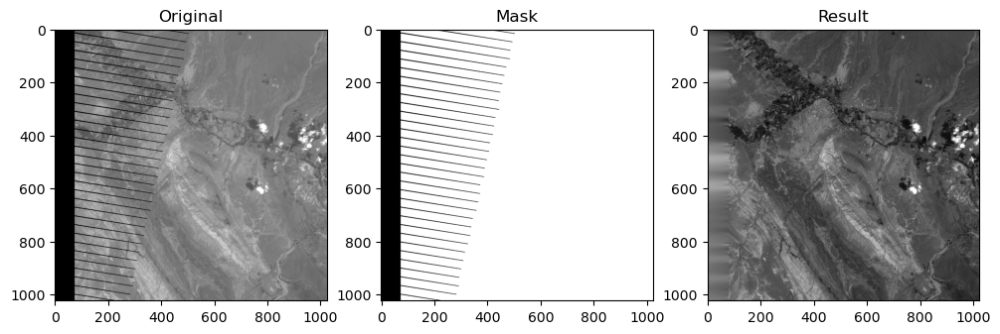

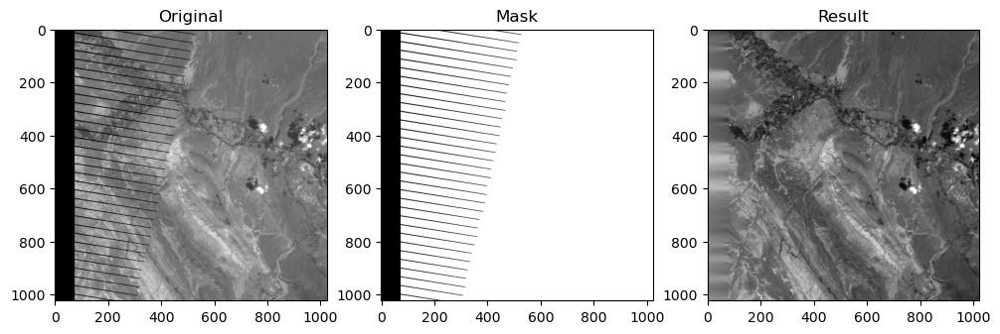

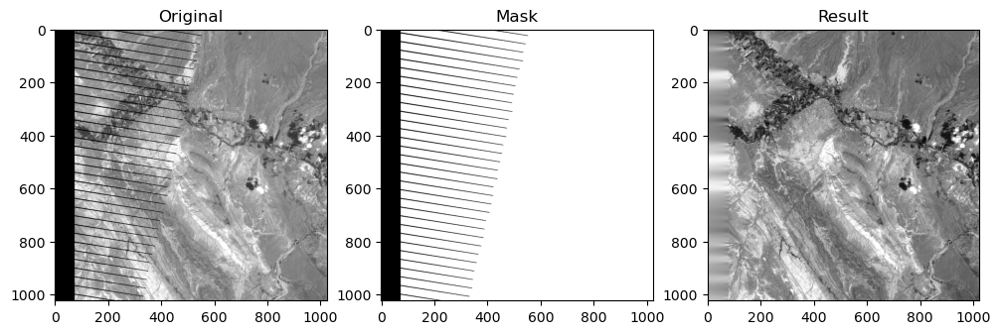

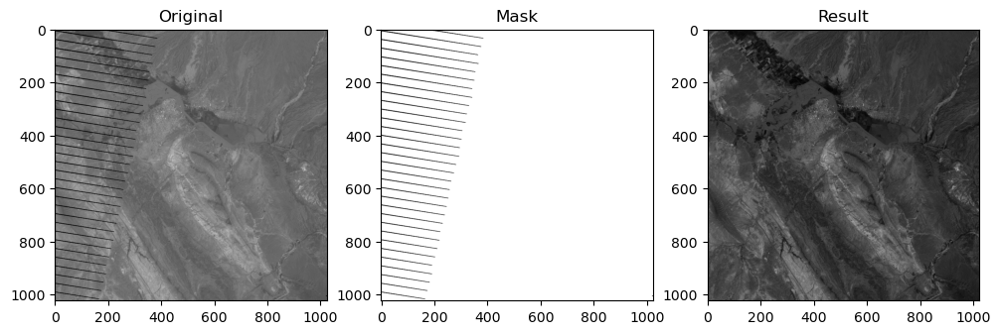

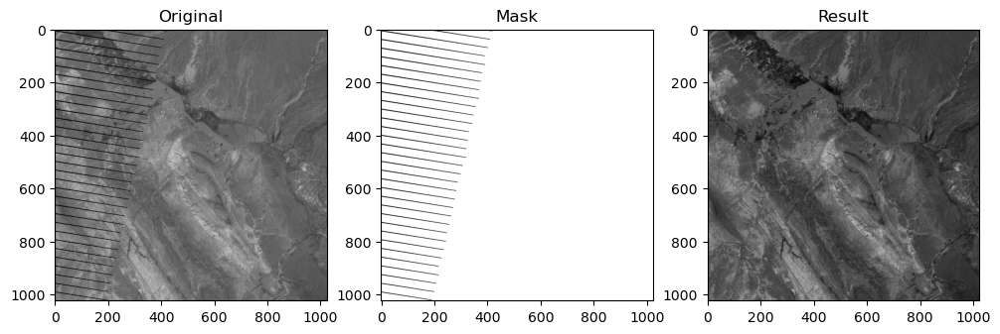

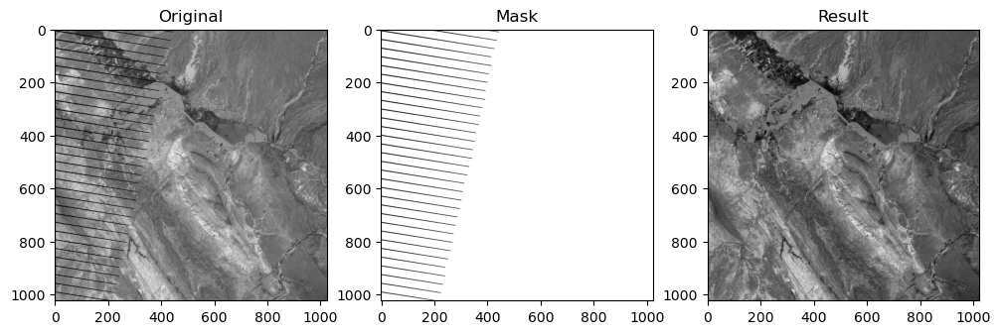

In [40]:
# Removing black bands from images
august_processed = []
september_processed = []

for i in range(len(august_bands_aligned)):
    if i not in (5, 6, 8):
        ratio = 0.01
    else:
        ratio = 0.2

    img, mask = calculate_mask(august_bands_aligned[i], ratio)
    
    # We use the basic inpainting algorithm.
    img, rec = do_inpainting(img, mask, 1)
    august_processed.append(rec)
    
    # Show only the first 3 images
    if i in (0, 1, 2): 
        plt.figure(figsize=(12, 6))
        
        plt.subplot(131)
        plt.imshow(img, 'gray')
        plt.title("Original")
        
        plt.subplot(132)
        plt.imshow(mask, 'gray')
        plt.title("Mask")
        
        plt.subplot(133)
        plt.imshow(rec, 'gray')
        plt.title("Result")
        
        plt.show()

# Process September bands similarly
for i in range(len(september_bands)):
    if i not in (5, 6, 8):
        ratio = 0.01
    else:
        ratio = 0.2

    img, mask = calculate_mask(september_bands[i], ratio)
    img, rec = do_inpainting(img, mask, 1)
    september_processed.append(rec)
    
    # Show only the first 3 images
    if i in (0, 1, 2): 
        plt.figure(figsize=(12, 6))
        
        plt.subplot(131)
        plt.imshow(img, 'gray')
        plt.title("Original")
        
        plt.subplot(132)
        plt.imshow(mask, 'gray')
        plt.title("Mask")
        
        plt.subplot(133)
        plt.imshow(rec, 'gray')
        plt.title("Result")
        
        plt.show()


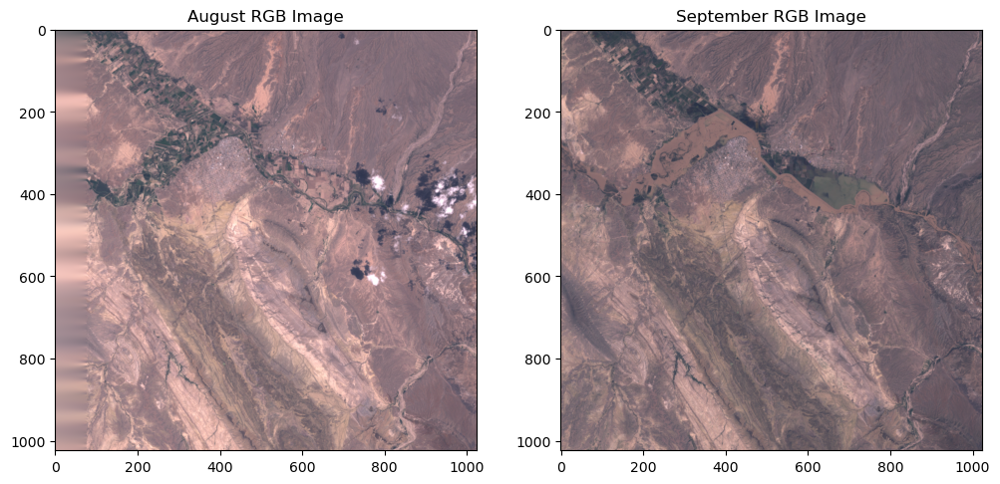

In [41]:
import cv2
import matplotlib.pyplot as plt

# After processing, use these lists to store the inpainted images
# `august_processed` and `september_processed` are assumed to already contain the processed images for August and September bands.

# Combine the bands 1-3 for August and September to form RGB images
img_rgb_august = cv2.merge([august_processed[0], august_processed[1], august_processed[2]])
img_rgb_september = cv2.merge([september_processed[0], september_processed[1], september_processed[2]])

# Display the RGB images
plt.figure(figsize=(12, 8))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img_rgb_august, cv2.COLOR_BGR2RGB))
plt.title("August RGB Image")

plt.subplot(122)
plt.imshow(cv2.cvtColor(img_rgb_september, cv2.COLOR_BGR2RGB))
plt.title("September RGB Image")
plt.show()


### Calculating the flood area estimate in Texas (km²), using NDWI index

To calculate the flood area estimate, we are going to perform different steps:
1. Calculating the NDWI (Normalized Water Index). It will give us a weight matrix where we will clearly see the water areas differentiated since they will have a higher value (or less value depending on the bands and formula that we apply).
2. With that matrix as an image, we can threshold and obtain all the pixels corresponding to the flood water.
3. Since in the LandSAT description we have how much each pixel measures in the image obtained by satellite (for LandSat 7, ETM+ Sensor, Bands 4 and 5 - 30 meters<sup>2</sup>), we can easily calculate how much surface has water.

With this, we have everything ready to perform the calculation.

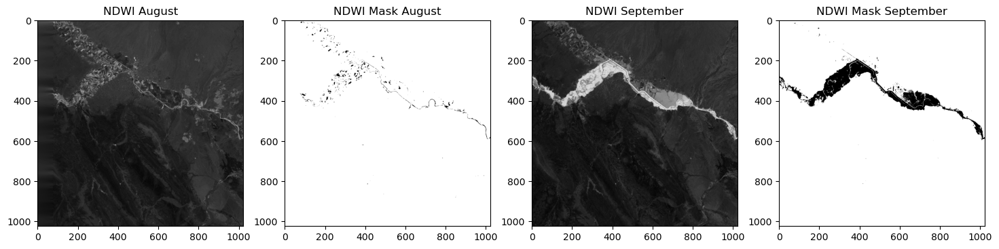

In [42]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assume 'calculate_mask' function is already defined
# Also assume 'august_processed' and 'september_processed' contain preprocessed image bands

# ########################################################
# NDWI CALCULATION FOR AUGUST IN TEXAS
# ########################################################
nir_band_august = august_processed[3].astype(np.float32)  # Near IR band (August)
mir_band_august = august_processed[4].astype(np.float32)  # Mid IR band (August)

# We calculate NDVI
# NDWI = B4 – B5 / B4 + B5 (Landsat TM/ETM+ B4:0.75-0.9 B5:1.55-1.75)
# This indicator is the one that has convinced me the most. It appears in the paper
# "Classification using multi temporal MODIS data with Köppen Climate Chart "
# NSIDC Soil Moisture Experiment 2002 (SMEX02) project was defined NDWI as
# NDWI = B4 – B5 / B4 + B5 (Landsat TM/ETM+ B4:0.75-0.9 B5:1.55-1.75)
# This LandSat TM/ETM+ is the device from which we have the images,
# that is why this calculation is so appropriate. In RGB.
# bands 4 and 5, which are NIR and MIR (near and short/medium infrared)

# NDWI calculation
ndwi_august = (nir_band_august - mir_band_august) / (nir_band_august + mir_band_august)  # Calculating NDWI
# We have infinite values and NaNs by the operation, we regularize
ndwi_august = np.where(np.isinf(ndwi_august), 1, ndwi_august)  # Handle infinities
ndwi_august = np.nan_to_num(ndwi_august, nan=0)  # Set NaNs to 0
# Normalizing to range between 0 and 255
ndwi_august = cv2.normalize(ndwi_august, None, 0, 255, cv2.NORM_MINMAX)
# Convert to integer format
ndwi_august = ndwi_august.astype('uint8')

# We calculate mask at 50% threshold
img_august, mask_august = calculate_mask(ndwi_august, 0.50)
mask_august_ndwi = 255 - mask_august  # Invert mask

# ########################################################
# NDWI CALCULATION FOR SEPTEMBER IN TEXAS
# ########################################################
nir_band_september = september_processed[3].astype(np.float32)  # Near IR band (September)
mir_band_september = september_processed[4].astype(np.float32)  # Mid IR band (September)

# NDWI calculation
ndwi_september = (nir_band_september - mir_band_september) / (nir_band_september + mir_band_september)
# We have infinite values and NaNs by the operation, we regularize
ndwi_september = np.where(np.isinf(ndwi_september), 1, ndwi_september)  # Handle infinities
ndwi_september = np.nan_to_num(ndwi_september, nan=0)  # Set NaNs to 0
# Normalizing to range between 0 and 255
ndwi_september = cv2.normalize(ndwi_september, None, 0, 255, cv2.NORM_MINMAX)
# Convert to integer format
ndwi_september = ndwi_september.astype('uint8')

# We calculate mask at 50% threshold
img_september, mask_september = calculate_mask(ndwi_september, 0.50)
mask_september_ndwi = 255 - mask_september  # Invert mask

# ########################################################
# DISPLAY RESULTS
# ########################################################
plt.figure(figsize=(18, 6))

plt.subplot(141)
plt.imshow(ndwi_august, 'gray')
plt.title("NDWI August")

plt.subplot(142)
plt.imshow(mask_august_ndwi, 'gray')
plt.title("NDWI Mask August")

plt.subplot(143)
plt.imshow(ndwi_september, 'gray')
plt.title("NDWI September")

plt.subplot(144)
plt.imshow(mask_september_ndwi, 'gray')
plt.title("NDWI Mask September")

plt.show()


In [43]:
# 3. CALCULATION OF KM^2 

# a. Count the number of black (0) pixels (Thresholding and binary normalization have been applied in the mask calculation function)
num_pixels_august = np.sum(mask_august_ndwi == 0)
num_pixels_september = np.sum(mask_september_ndwi == 0)

# Assuming calcula_km_afectados is a defined function that converts pixel count to km^2
km_august = calculate_km_affected(num_pixels_august)
km_september = calculate_km_affected(num_pixels_september)

print(f"Approximation of water surface area in August: {round(km_august, 2)} km^2")
print(f"Approximation of water surface area in September: {round(km_september, 2)} km^2\n")
print(f"Approximation of abnormal water surface area due to flooding in Texas: {round(km_september - km_august, 2)} km^2")


Approximation of water surface area in August: 5.24 km^2
Approximation of water surface area in September: 39.97 km^2

Approximation of abnormal water surface area due to flooding in Texas: 34.73 km^2


# 2. ARIZONA FIRE

- **If you combine bands 7, 5 and 4 (like R,G,B) you can get a false color image that allows you to clearly see the burned area and the fire hotspots.**
- **Calculate an estimate of the area of ​​the burned area (in km2). You can do this in different ways:**
- Using some vegetation index (NDVI, ...). At the end of this document you have more information.
- Using the false color image.
- ...

- **Implement the algorithm in the document and check if it is useful to detect the fire hotspots. Compare the results with the previous image (false color).**

</br>

In [44]:
# Loading Bands

# August Bands
# (61 and 62 are in 512 and expand to 1014 in 61s and 62s, we keep these)
# band8 in 2048x2048, it is reduced in band8s, we keep this one
arizona_banda1 = cv2.imread("LandSat/arizona/banda1.tif", 0)
arizona_banda2 = cv2.imread("LandSat/arizona/banda2.tif", 0)
arizona_banda3 = cv2.imread("LandSat/arizona/banda3.tif", 0)
arizona_banda4 = cv2.imread("LandSat/arizona/banda4.tif", 0)
arizona_banda5 = cv2.imread("LandSat/arizona/banda5.tif", 0)
arizona_banda6 = cv2.imread("LandSat/arizona/banda6.tif", 0)
arizona_banda7 = cv2.imread("LandSat/arizona/banda7.tif", 0)
arizona_rgb = cv2.imread("LandSat/arizona/rgb.jpg")

# Create a list of all bands
arizona_bands = [arizona_banda1, arizona_banda2, arizona_banda3, arizona_banda4, arizona_banda5,
                 arizona_banda6, arizona_banda7]

# Check the size of one of the images to verify they are loaded correctly
arizona_banda1.shape


(1900, 1301)

#### **2.1. Combination of bands 7.5 and 5. False color image.**

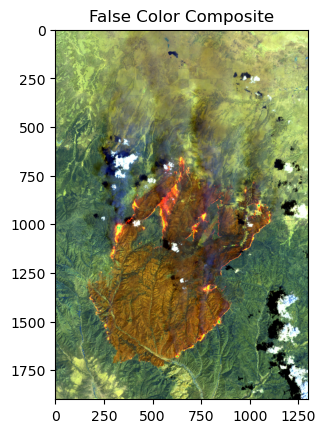

In [45]:
# Convert the grayscale bands to 3-channel images for visualization in RGB format
arizona_band7_rgb = cv2.merge([arizona_banda7, arizona_banda7, arizona_banda7])
arizona_band5_rgb = cv2.merge([arizona_banda5, arizona_banda5, arizona_banda5])
arizona_band4_rgb = cv2.merge([arizona_banda4, arizona_banda4, arizona_banda4])

# Create a false-color composite by merging the bands
# Here, we use the red channel of each band
arizona_false_color = cv2.merge([
    arizona_band7_rgb[:, :, 0],  # NIR band as red
    arizona_band5_rgb[:, :, 0],  # MIR band as green
    arizona_band4_rgb[:, :, 0]   # Red band as blue
])

# Display the false-color image
plt.imshow(arizona_false_color)
plt.title("False Color Composite")
plt.show()


##### **ALTERNATIVE 1: Using some vegetation index (NDVI)**

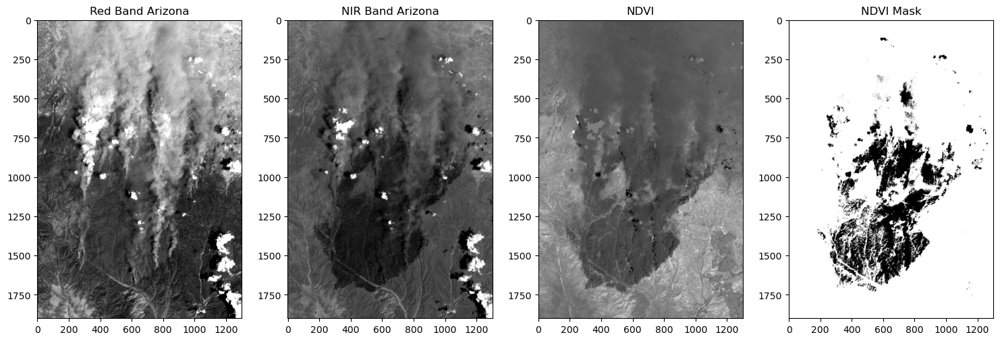

In [46]:
# We can apply the formula indicated in (https://es.wikipedia.org/wiki/%C3%8Dndice_de_vegetaci%C3%B3n_de_diferencia_normalizada):
# (NIR - RED)/(NIR + RED)

# bands 3 and 4, which are RED and NIR
red_band = arizona_banda3
nir_band = arizona_banda4

# We calculate NDVI
red_band = red_band.astype(np.float32)
nir_band = nir_band.astype(np.float32)
ndvi = (nir_band - red_band) / (nir_band + red_band)

# We also have NaNs, we set them to an average value between -1 and 1
ndvi = np.nan_to_num(ndvi, nan=0)

# We normalize between 0 and 255
ndvi = cv2.normalize(ndvi, None, 0, 255, cv2.NORM_MINMAX)

# We pass to integer
ndvi = ndvi.astype('uint8')

# We calculate mask
img_arizona, mask_arizona = calculate_mask(ndvi, 0.30)

# We show NDVI in BGR
plt.figure(figsize=(15, 6))
plt.subplot(141)
plt.imshow(red_band, 'gray')
plt.title("Red Band Arizona")

plt.subplot(142)
plt.imshow(nir_band, 'gray')
plt.title("NIR Band Arizona")

plt.subplot(143)
plt.imshow(ndvi, 'gray')
plt.title("NDVI")

plt.subplot(144)
plt.imshow(mask_arizona, 'gray')
plt.title("NDVI Mask")

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [47]:
# We calculate km affected 
num_pixels_affected = np.sum(mask_arizona == 0)  # Count black pixels (0) in the mask
km = calculate_km_affected(num_pixels_affected)  # Convert pixel count to km^2

print(f"Approximation of Km^2 of surface affected in the Arizona fire: {round(km, 2)} km^2")


Approximation of Km^2 of surface affected in the Arizona fire: 275.09 km^2


##### **ALTERNATIVE 2: Using the false color image.**

(<Axes: title={'center': 'Arizona Mask Affected Area Inv.'}>,
 Text(0.5, 1.0, 'Arizona Mask Affected Area Inv.'))

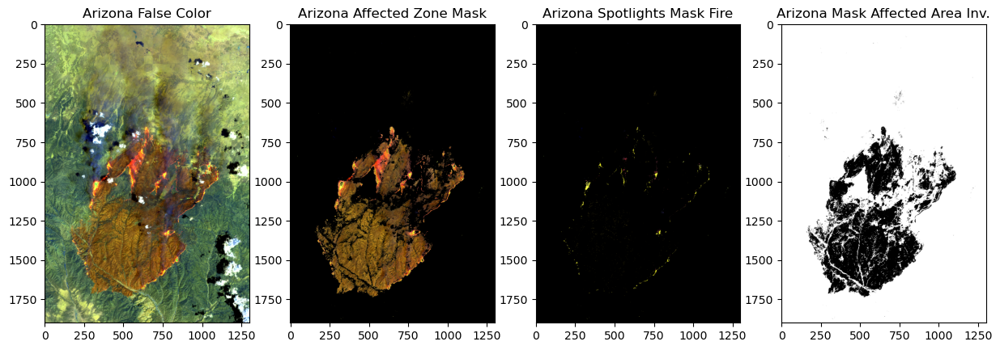

In [48]:
# This process is very similar to the previous exercise
# This time we move to hsv, it will be easier for us to work
# luminosity, etc
img_hsv = cv2.cvtColor(arizona_false_color, cv2.COLOR_RGB2HSV)
img_bgr = cv2.cvtColor(arizona_false_color, cv2.COLOR_RGB2BGR)

# We look for the values that contain reds (low red range)
lower_red = np.array([0, 128, 50])
upper_red = np.array([22, 255, 255])
mask1 = cv2.inRange(img_hsv, lower_red, upper_red)

# We obtain a mask with the red values (high red range)
lower_red = np.array([120, 128, 50])
upper_red = np.array([180, 255, 255])
mask2 = cv2.inRange(img_hsv, lower_red, upper_red)

# We get a mask with the yellow values
lower_yellow = np.array([30, 140, 255])
upper_yellow = np.array([45, 255, 255])
mask3 = cv2.inRange(img_hsv, lower_yellow, upper_yellow)

# We get a mask with the orange values
lower_orange = np.array([25, 180, 100])
upper_orange = np.array([25, 255, 255])
mask4 = cv2.inRange(img_hsv, lower_orange, upper_orange)

# We join masks with OR operation to obtain
# the affected area mask with all the masks
mask = cv2.bitwise_or(mask1, mask2)
mask = cv2.bitwise_or(mask, mask3)
mask = cv2.bitwise_or(mask, mask4)

# We join masks of oranges, yellows, and high reds for foci
mask_focos = cv2.bitwise_or(mask3, mask4)
mask_focos = cv2.bitwise_or(mask_focos, mask2)

# We perform an AND operation between the original image and the mask
res_afectada = cv2.bitwise_and(img_bgr, img_bgr, mask=mask) 
res_focos = cv2.bitwise_and(img_bgr, img_bgr, mask=mask_focos)

plt.figure(figsize=(15, 6))
plt.subplot(141), plt.imshow(arizona_false_color), plt.title("Arizona False Color")
plt.subplot(142), plt.imshow(cv2.cvtColor(res_afectada, cv2.COLOR_BGR2RGB)), plt.title("Arizona Affected Zone Mask")
plt.subplot(143), plt.imshow(cv2.cvtColor(res_focos, cv2.COLOR_BGR2RGB)), plt.title("Arizona Spotlights Mask Fire")
plt.subplot(144), plt.imshow(cv2.cvtColor(255 - mask, cv2.COLOR_BGR2RGB)), plt.title("Arizona Mask Affected Area Inv.")

# This method obtains better results and is more reliable than the previous one. If I had to give an estimate of the affected area, I would give this one.
# The affected area and the fire sources are displayed quite well.


In [49]:
# Let's invert the mask (Although it doesn't matter, instead of counting 0 we would count 255)
mask_binary = 255 - mask  # Inverts the mask: affected areas become white (255) and unaffected areas become black (0)

# Count the number of pixels affected
num_pixeles_afectados = np.sum(mask_binary == 255)  # Count white pixels in the inverted mask

# Calculate affected area in km²
km = calculate_km_affected(num_pixeles_afectados)

print(f"Approximation of Km^2 of surface affected by the Arizona fire: {round(km, 2)} km^2")


Approximation of Km^2 of surface affected by the Arizona fire: 1901.1 km^2


#### **2.2. Implement the algorithm from the document** *Forest fire detection using the normalized multi-band drought index (NMDI) with satellite measurements* **and check if it is useful for detecting fire hotspots. Compare the results with the previous image (false color).**

The algorithm is shown in the following image.

<img src="doc/alg_articulo.png" width=40%>

Being NMDI:

<img src="doc/NMDI.png" width=20%>

Where each R<sub>xx</sub> are the reflectances in micrometers observed by the satellite in the different bands.
Looking at the LandSat detail we can see that:

- R<sub>0.86</sub> corresponds to the NIR band
- R<sub>1.64</sub> corresponds to the Mid IR band
- R<sub>2.13</sub> corresponds to another Mid IR band at a different spectral resolution.

Several experiments are carried out with the algorithm in the paper.
Finally, I indicate here the one that has worked best for me.

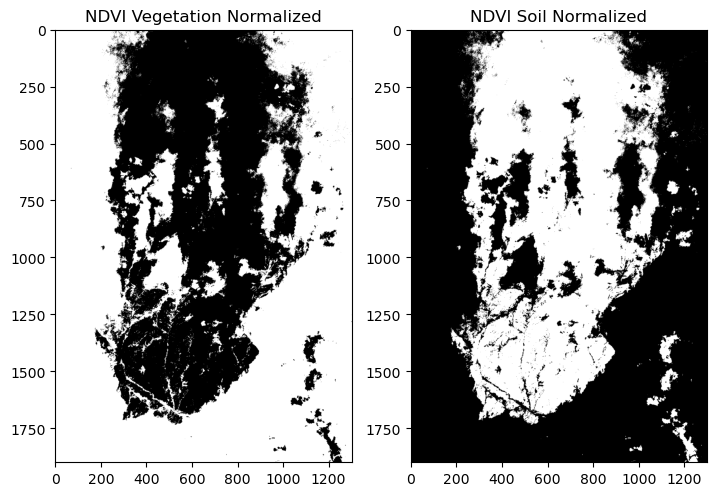

In [50]:
# The best results are obtained only by using the NVDI and NMDI OF VEGATTION and applying the threshold that appears appropriate. So:

# 1. NDVI calculation
# Bands 3 and 4, which are RED and NIR
red_band = arizona_banda3
nir_band = arizona_banda4

# We calculate NDVI
red_band = red_band.astype(np.float32)
nir_band = nir_band.astype(np.float32)
ndvi = (nir_band - red_band) / (nir_band + red_band)

# Handle NaNs by setting them to -1
ndvi = np.nan_to_num(ndvi, nan=-1)

# Normalize NDVI between 0 and 1
ndvi = cv2.normalize(ndvi, None, 0, 1, cv2.NORM_MINMAX)

# Calculate the 40th percentile to distinguish between soil and vegetation
percentile_40 = np.percentile(ndvi, 40)

# Create masks for vegetation and soil
ndvi_veg = np.where(ndvi >= percentile_40, 255, 0)  # Vegetation mask
ndvi_soil = 255 - ndvi_veg  # Soil mask

# Display the results
plt.figure(figsize=(13, 6))
plt.subplot(131), plt.imshow(ndvi_veg, 'gray'), plt.title("NDVI Vegetation Normalized")
plt.subplot(132), plt.imshow(ndvi_soil, 'gray'), plt.title("NDVI Soil Normalized")
plt.show()


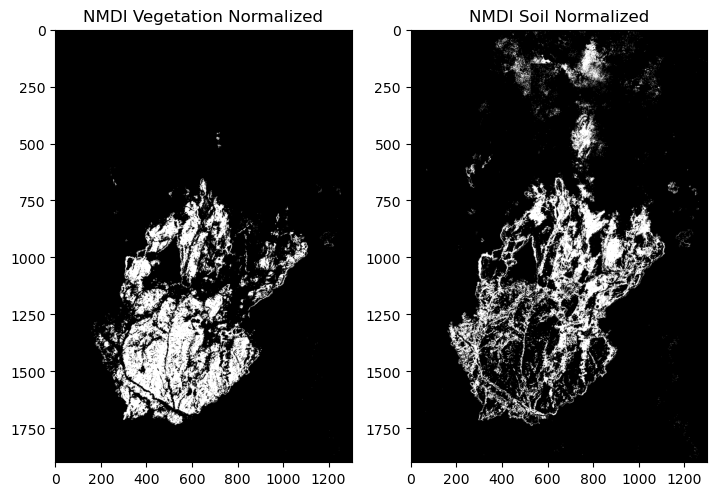

In [55]:
# 2. Calculating NMDI
nir_band = arizona_banda4
mnir_band = arizona_banda5
mnir_band_2 = arizona_banda7

# We calculate NMDI
nir_band = nir_band.astype(np.float32)
mnir_band = mnir_band.astype(np.float32)
mnir_band_2 = mnir_band_2.astype(np.float32)

# NMDI calculation
nmdi = (nir_band - (mnir_band - mnir_band_2)) / (nir_band + (mnir_band - mnir_band_2))

# Regularizing infinite values and NaNs
nmdi = np.where(np.isinf(nmdi), 1, nmdi)
nmdi = np.nan_to_num(nmdi, nan=-1)

# Normalize NMDI between 0 and 1
nmdi = cv2.normalize(nmdi, None, 0, 1, cv2.NORM_MINMAX)

# Define vegetation and soil based on NMDI
nmdi_veg = nmdi
nmdi_soil = 0.9 - nmdi_veg

# Calculate percentiles for vegetation and soil
percentil_20_veg = np.percentile(nmdi_veg, 10)
percentil_20_soil = np.percentile(nmdi_soil, 10)

# Separate fire and non-fire pixels
nmdi_veg_mask = np.where(nmdi_veg <= percentil_20_veg, 255, 0)
nmdi_soil_mask = np.where(nmdi_soil <= percentil_20_soil, 255, 0)

# Display results
plt.figure(figsize=(13, 6))
plt.subplot(131)
plt.imshow(nmdi_veg_mask, 'gray')
plt.title("NMDI Vegetation Normalized")

plt.subplot(132)
plt.imshow(nmdi_soil_mask, 'gray')
plt.title("NMDI Soil Normalized")

plt.show()


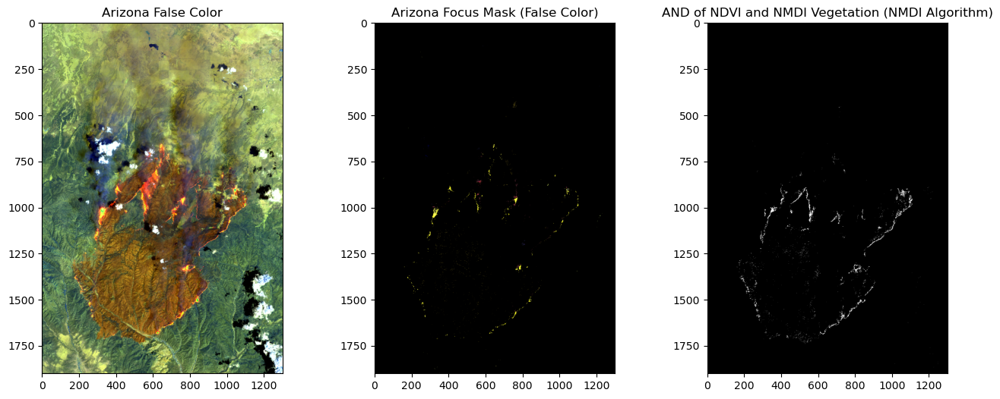

In [63]:
# Ensure ndvi_veg and nmdi_veg_mask are single-channel images and have compatible shapes and types
if ndvi_veg.shape != nmdi_veg_mask.shape:
    # Resize ndvi_veg to match the shape of nmdi_veg_mask if needed
    ndvi_veg = cv2.resize(ndvi_veg, (nmdi_veg_mask.shape[1], nmdi_veg_mask.shape[0]))

# Convert both ndvi_veg and nmdi_veg_mask to uint8 if they are not already
ndvi_veg = ndvi_veg.astype(np.uint8)
nmdi_veg_mask = nmdi_veg_mask.astype(np.uint8)

# Ensure ndvi_veg is single-channel (in case it's multi-channel)
if len(ndvi_veg.shape) == 3 and ndvi_veg.shape[2] > 1:
    ndvi_veg = cv2.cvtColor(ndvi_veg, cv2.COLOR_BGR2GRAY)

# Apply bitwise AND operation using the updated NMDI masks
mask_1 = cv2.bitwise_and(ndvi_veg, nmdi_veg_mask)  # Both should now be single-channel uint8 arrays
mask_2 = cv2.bitwise_and(ndvi_soil.astype(np.uint8), nmdi_soil_mask.astype(np.uint8))

# Display the results
plt.figure(figsize=(16, 6))

# Display the original false color image
plt.subplot(131)
plt.imshow(arizona_false_color)
plt.title("Arizona False Color")

# Display the result from another processing (assuming res_focos is defined)
plt.subplot(132)
plt.imshow(cv2.cvtColor(res_focos, cv2.COLOR_BGR2RGB))
plt.title("Arizona Focus Mask (False Color)")

# Display the result of the AND operation for vegetation
plt.subplot(133)
plt.imshow(mask_1, 'gray')
plt.title("AND of NDVI and NMDI Vegetation (NMDI Algorithm)")

plt.show()


# 3. ADRA

**In the Adra image, make use of the panchromatic (high resolution) band to produce a high resolution (RGB) color image (twice the resolution of the visible R, G, B bands). You can apply some color enhancement algorithm to the result to make it more vivid or colorful. To obtain a higher resolution RGB image using the panchromatic image use:**
1. **In the HSV representation change the luminance for the panchromatic image**
2. **Using the wavelet transform of the panchromatic image as suggested in this article**
3. **Any other algorithm proposed by you**

</br>

In [64]:
# We load bands 
adra_banda1 = cv2.imread("LandSat/adra/banda1.tif",0) 
adra_banda2 = cv2.imread("LandSat/adra/banda2.tif",0) 
adra_banda3 = cv2.imread("LandSat/adra/ banda3.tif",0)
adra_banda4 = cv2.imread("LandSat/adra/banda4.tif",0)
adra_banda5 = cv2.imread("LandSat/adra/banda5.tif",0) 
adra_banda61 = cv2.imread(" LandSat/adra/banda61.tif",0)
adra_banda62 = cv2.imread("LandSat/adra/banda62.tif",0)
adra_banda7 = cv2.imread("LandSat/adra/banda7.tif",0)
adra_banda8 = cv2.imread("LandSat/adra/banda8.tif",0)

adra_rgb = cv2.imread("LandSat/adra/rgb.jpg")
 # Let's see the dimensions of the images (all the selected ones have the same dimension):
adra_banda8.shape

(512, 512)

(<Axes: >, <matplotlib.image.AxesImage at 0x252a3651410>)

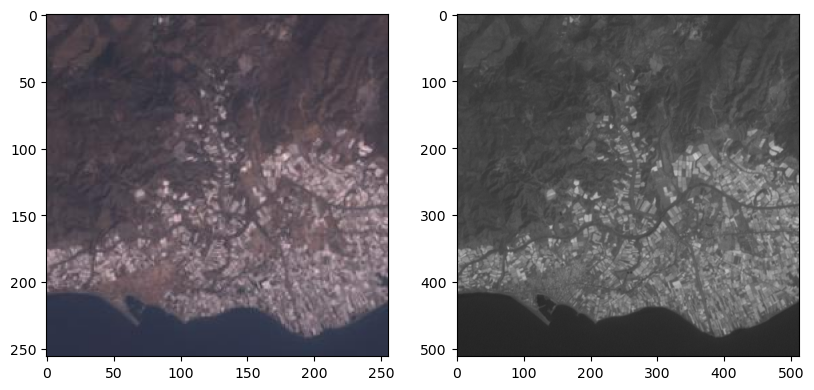

In [65]:
# Loaded representation of Adra RGB and Panchromatic band
plt.figure(figsize=(15,6))
plt.subplot(131), plt.imshow(cv2.cvtColor(adra_rgb, cv2.COLOR_BGR2RGB))
plt.subplot(132), plt.imshow(cv2.cvtColor(adra_banda8, cv2.COLOR_BGR2RGB))

# At first glance, it is seen that the panchromatic has a better resolution than the RGB that is provided to us
# We could have calculated the RGB as we did in exercise 1, but it is already given to us:
# img_rgb_adra = cv2.merge([adra_banda1, adra_banda2, adra_banda3])

##### **ALTERNATIVE 1: In the HSV representation, change the luminance for the panchromatic image**

(<Axes: title={'center': 'Adra Improved'}>,
 Text(0.5, 1.0, 'Adra Improved'))

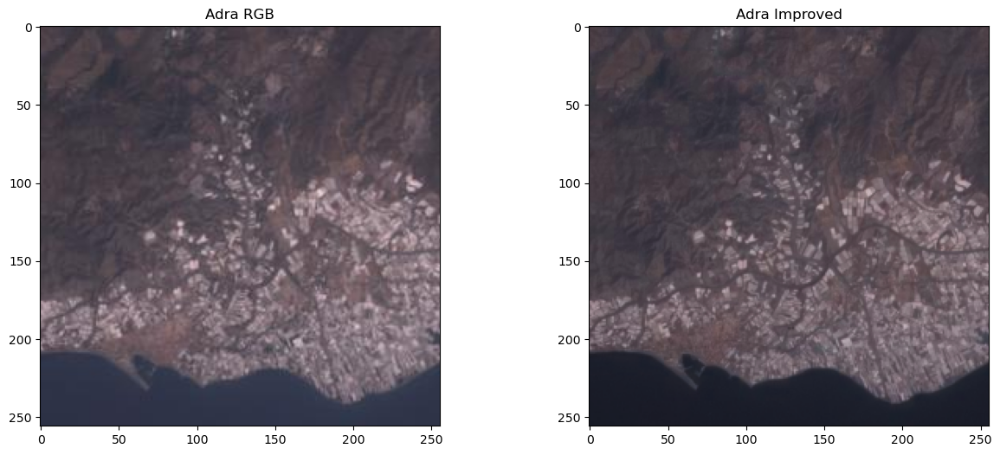

In [66]:
# Convert the RGB we have to HSV
adra_hsv = cv2.cvtColor(adra_rgb, cv2.COLOR_BGR2HSV)
# Since the panchromatic has double the resolution, we change its size
pancromatica = cv2.resize(adra_banda8, (adra_banda1.shape[1], adra_banda1.shape[0]))
# Replace the luminance with band 8, which is Panchromatic
adra_hsv[:, :, 2] = pancromatica
# Convert back to RGB and visualize
adra_better = cv2.cvtColor(adra_hsv, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(15,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(adra_rgb,cv2.COLOR_BGR2RGB)), plt.title("Adra RGB")
plt.subplot(122), plt.imshow(adra_better), plt.title("Adra Improved")

# Yes, you can see the higher resolution. Look at the cape below and the road lines

##### **ALTERNATIVE 2: Using the wavelet transform of the panchromatic image as suggested in this [article](https://www.rroij.com/open-access/pixellevel-image-fusion-usingbrovey-transforme-and-wavelettransform.pdf)**

The indicated paper provides the following algorithm for merging in a Wavelet.

<img src="doc/alg_articulo2.png">

It also indicates that it has used biorthogonal transformations, so we will use bior3.7

Shape of Panchromatic Band: (512, 512)


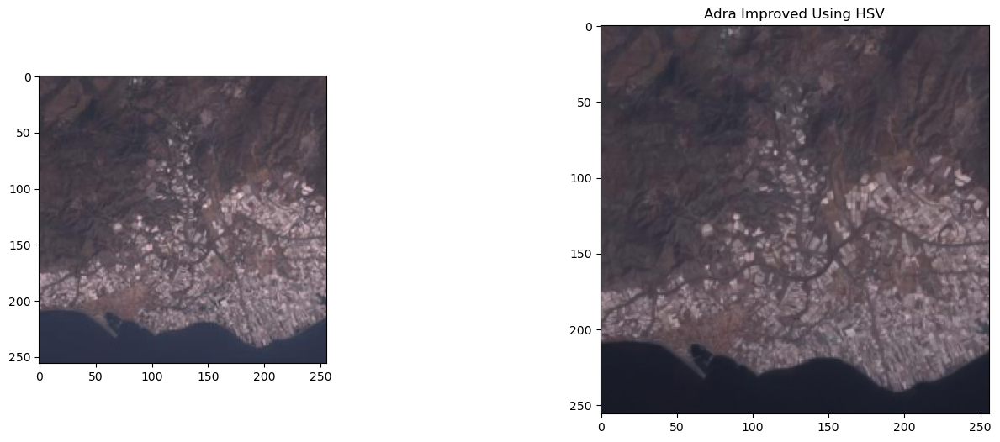

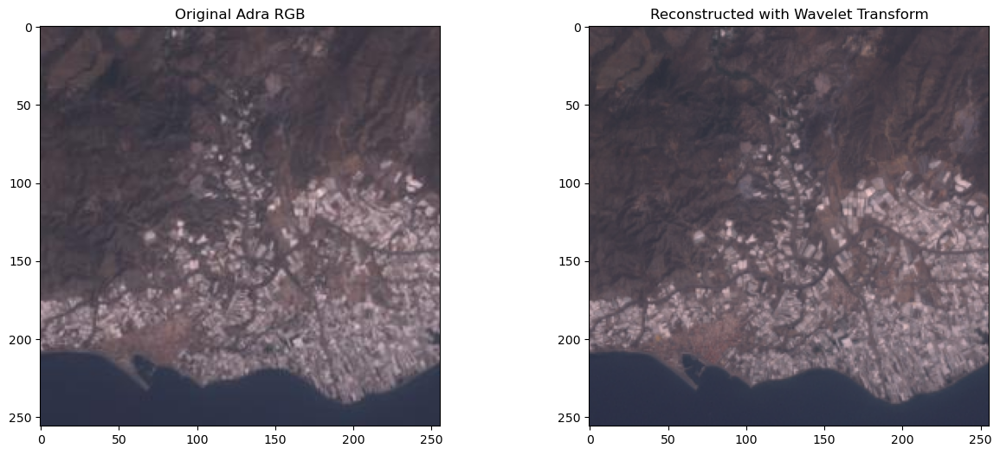

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt

# Load bands
adra_banda1 = cv2.imread("LandSat/adra/banda1.tif", 0) 
adra_banda2 = cv2.imread("LandSat/adra/banda2.tif", 0) 
adra_banda3 = cv2.imread("LandSat/adra/banda3.tif", 0)
adra_banda8 = cv2.imread("LandSat/adra/banda8.tif", 0)

adra_rgb = cv2.imread("LandSat/adra/rgb.jpg")

# Let's see the dimensions of the images (all the selected ones have the same dimension):
print("Shape of Panchromatic Band:", adra_banda8.shape)

# Display loaded images
plt.figure(figsize=(15, 6))
plt.subplot(131), plt.imshow(cv2.cvtColor(adra_rgb, cv2.COLOR_BGR2RGB))
plt.subplot(132), plt.imshow(cv2.cvtColor(adra_banda8, cv2.COLOR_BGR2RGB))
plt.title("Panchromatic Band")

# Alternative 1: In the HSV representation, change the luminance for the panchromatic image
# Convert the RGB we have to HSV
adra_hsv = cv2.cvtColor(adra_rgb, cv2.COLOR_BGR2HSV)

# Since the panchromatic has double the resolution, we change its size
pancromatica = cv2.resize(adra_banda8, (adra_banda1.shape[1], adra_banda1.shape[0]))

# Replace the luminance with the panchromatic band
adra_hsv[:, :, 2] = pancromatica

# Convert back to RGB and visualize
adra_better = cv2.cvtColor(adra_hsv, cv2.COLOR_HSV2RGB)

plt.subplot(122), plt.imshow(adra_better)
plt.title("Adra Improved Using HSV")
plt.show()

# Alternative 2: Using the wavelet transform of the panchromatic image
# We put the bands in names that are easy to identify
banda1 = adra_banda1
banda2 = adra_banda2
banda3 = adra_banda3

# Resize the panchromatic band to match the others
pancromatica = cv2.resize(adra_banda8, (adra_banda1.shape[1], adra_banda1.shape[0]))

bandas_rec = []

# Iterate for each R, G, B band
for band in [banda1, banda2, banda3]:
    # Obtain wavelet coefficients of the panchromatic band
    coeffs = pywt.dwt2(pancromatica, 'bior3.7')
    (LL, (HL, LH, HH)) = coeffs

    # Obtain coefficients of the band to analyze
    coeffs_band = pywt.dwt2(band, 'bior3.7')
    (LL_band, (HL_band, LH_band, HH_band)) = coeffs_band

    # Replace the approximation coefficient of the panchromatic
    # with the approximation coefficient of the band under study
    LL_a_reemplazar = LL_band

    # Reconstruct the image using the new coefficients
    rec = pywt.idwt2((LL_a_reemplazar, (HL, LH, HH)), 'bior3.7')
    rec = rec.astype('uint8')

    # Add to the processed bands array
    bandas_rec.append(rec)

# With the reconstructed bands, we merge
rec_def = cv2.merge([bandas_rec[0], bandas_rec[1], bandas_rec[2]])

# Show the results
plt.figure(figsize=(15, 6))
plt.subplot(121), plt.imshow(cv2.cvtColor(adra_rgb, cv2.COLOR_BGR2RGB)), plt.title("Original Adra RGB")
plt.subplot(122), plt.imshow(cv2.cvtColor(rec_def, cv2.COLOR_BGR2RGB)), plt.title("Reconstructed with Wavelet Transform")
plt.show()

# The result should show better details, especially in areas like roads and the bay.


# Flood prediction Model

In [1]:
#Import some basic libraries
import numpy as np
import pandas as pd

In [2]:
#Read the data present in dataset
data = pd.read_csv('Flood prediction dataset/kerala.csv')
#Using data.head() we can see the top 5 rows of the dataset
data.head()

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL RAINFALL,FLOODS
0,KERALA,1901,28.7,44.7,51.6,160.0,174.7,824.6,743.0,357.5,197.7,266.9,350.8,48.4,3248.6,YES
1,KERALA,1902,6.7,2.6,57.3,83.9,134.5,390.9,1205.0,315.8,491.6,358.4,158.3,121.5,3326.6,YES
2,KERALA,1903,3.2,18.6,3.1,83.6,249.7,558.6,1022.5,420.2,341.8,354.1,157.0,59.0,3271.2,YES
3,KERALA,1904,23.7,3.0,32.2,71.5,235.7,1098.2,725.5,351.8,222.7,328.1,33.9,3.3,3129.7,YES
4,KERALA,1905,1.2,22.3,9.4,105.9,263.3,850.2,520.5,293.6,217.2,383.5,74.4,0.2,2741.6,NO


In [3]:
#Now we will cheak if any colomns is left empty
data.apply(lambda x:sum(x.isnull()), axis=0)

SUBDIVISION         0
YEAR                0
JAN                 0
FEB                 0
MAR                 0
APR                 0
MAY                 0
JUN                 0
JUL                 0
AUG                 0
SEP                 0
OCT                 0
NOV                 0
DEC                 0
 ANNUAL RAINFALL    0
FLOODS              0
dtype: int64

In [4]:
#We want the data in numbers, therefore we will replace the yes/no in floods coloumn by 1/0
data['FLOODS'].replace(['YES','NO'],[1,0],inplace=True)

In [5]:
#Let's see how are data looks like now
data.head()

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL RAINFALL,FLOODS
0,KERALA,1901,28.7,44.7,51.6,160.0,174.7,824.6,743.0,357.5,197.7,266.9,350.8,48.4,3248.6,1
1,KERALA,1902,6.7,2.6,57.3,83.9,134.5,390.9,1205.0,315.8,491.6,358.4,158.3,121.5,3326.6,1
2,KERALA,1903,3.2,18.6,3.1,83.6,249.7,558.6,1022.5,420.2,341.8,354.1,157.0,59.0,3271.2,1
3,KERALA,1904,23.7,3.0,32.2,71.5,235.7,1098.2,725.5,351.8,222.7,328.1,33.9,3.3,3129.7,1
4,KERALA,1905,1.2,22.3,9.4,105.9,263.3,850.2,520.5,293.6,217.2,383.5,74.4,0.2,2741.6,0


In [6]:
#Now let's seperate the data which we are gonna use for prediction
x = data.iloc[:,1:14]
x.head()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,1901,28.7,44.7,51.6,160.0,174.7,824.6,743.0,357.5,197.7,266.9,350.8,48.4
1,1902,6.7,2.6,57.3,83.9,134.5,390.9,1205.0,315.8,491.6,358.4,158.3,121.5
2,1903,3.2,18.6,3.1,83.6,249.7,558.6,1022.5,420.2,341.8,354.1,157.0,59.0
3,1904,23.7,3.0,32.2,71.5,235.7,1098.2,725.5,351.8,222.7,328.1,33.9,3.3
4,1905,1.2,22.3,9.4,105.9,263.3,850.2,520.5,293.6,217.2,383.5,74.4,0.2


In [7]:
#Now seperate the flood label from the dataset
y = data.iloc[:, -1]
y.head()

0    1
1    1
2    1
3    1
4    0
Name: FLOODS, dtype: int64

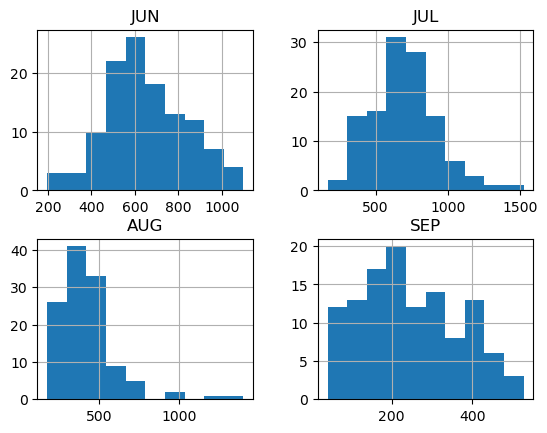

In [8]:
#Let's see hoe the rainfall index vary during rainy season
import matplotlib.pyplot as plt
%matplotlib inline
c = data[['JUN','JUL','AUG','SEP']]
c.hist()
plt.show()

In [9]:
#Data might be widely distributed so let's scale it between 0 and 1
from sklearn import preprocessing
minmax = preprocessing.MinMaxScaler(feature_range=(0,1))
minmax.fit(x).transform(x)

array([[0.        , 0.34371257, 0.56582278, ..., 0.39727673, 0.95570189,
        0.2388724 ],
       [0.00854701, 0.08023952, 0.03291139, ..., 0.5804966 , 0.37952709,
        0.60039565],
       [0.01709402, 0.03832335, 0.23544304, ..., 0.57188626, 0.37563604,
        0.29129575],
       ...,
       [0.98290598, 0.02874251, 0.04810127, ..., 0.31517821, 0.28105358,
        0.11622156],
       [0.99145299, 0.02275449, 0.08607595, ..., 0.24809772, 0.18258007,
        0.18793274],
       [1.        , 0.34850299, 0.65949367, ..., 0.57589107, 0.28105358,
        0.3214639 ]])

In [10]:
#Let's divide the dataset into 2 sets:train and test in ratio (4:1)
from sklearn import model_selection,neighbors
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [11]:
#Let's see how our train set looks like
x_train.head()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
52,1953,13.1,22.6,18.5,132.4,55.4,340.5,1027.6,356.4,100.5,410.5,62.2,5.1
37,1938,0.3,79.0,53.3,164.5,179.6,681.6,648.6,287.9,223.2,223.7,69.5,22.9
27,1928,12.7,65.9,51.3,121.1,81.9,590.7,420.6,553.2,75.9,321.5,155.2,52.7
79,1980,0.0,0.9,20.8,114.8,105.3,745.9,754.0,438.1,139.5,282.3,162.3,39.5
101,2002,4.7,8.7,35.7,117.3,330.8,503.1,318.7,438.2,99.0,511.7,137.5,2.1


In [12]:
y_train.head()

52     0
37     0
27     0
79     0
101    0
Name: FLOODS, dtype: int64

# Prediction Algorithms:

# 1. KNN Classifier

In [13]:
clf = neighbors.KNeighborsClassifier()
knn_clf = clf.fit(x_train,y_train)

In [14]:
#Let's predict chances of flood
y_predict = knn_clf.predict(x_test)
print('predicted chances of flood')
print(y_predict)

predicted chances of flood
[0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0]


In [15]:
#Actual chances of flood
print("actual values of floods:")
print(y_test)

actual values of floods:
68     0
114    0
2      1
105    1
17     0
31     1
56     1
83     0
75     0
14     1
34     0
23     1
93     1
70     1
47     1
54     1
63     0
102    0
86     0
26     1
71     0
9      0
39     1
36     0
Name: FLOODS, dtype: int64


In [16]:
from sklearn.model_selection import cross_val_score

In [17]:
knn_accuracy = cross_val_score(knn_clf,x_test,y_test,cv=3,scoring='accuracy',n_jobs=-1)

In [18]:
knn_accuracy.mean()

0.8333333333333334

# 2. Logistic Regression

In [68]:
x_train_std = minmax.fit_transform(x_train)
x_test_std = minmax.transform(x_test)

In [69]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr_clf = lr.fit(x_train_std,y_train)

lr_accuracy = cross_val_score(lr_clf,x_test_std,y_test,cv=3,scoring='accuracy',n_jobs=-1)

In [70]:
lr_accuracy.mean()

0.75

In [71]:
y_predict = lr_clf.predict(x_test_std)
print('Predicted chances of flood')
print(y_predict)

Predicted chances of flood
[0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 0 0 1 0 1 1 0]


In [72]:
print('Actual chances of flood')
print(y_test.values)

Actual chances of flood
[0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0]


In [73]:
from sklearn.metrics import accuracy_score,recall_score,roc_auc_score,confusion_matrix
print("\naccuracy score: %f"%(accuracy_score(y_test,y_predict)*100))
print("recall score: %f"%(recall_score(y_test,y_predict)*100))
print("roc score: %f"%(roc_auc_score(y_test,y_predict)*100))


accuracy score: 91.666667
recall score: 100.000000
roc score: 91.666667


# 3. Decision tree classification

In [74]:
from sklearn.tree import DecisionTreeClassifier
dtc_clf = DecisionTreeClassifier()
dtc_clf.fit(x_train,y_train)
dtc_clf_acc = cross_val_score(dtc_clf,x_train_std,y_train,cv=3,scoring="accuracy",n_jobs=-1)
dtc_clf_acc

array([0.75      , 0.61290323, 0.70967742])

In [75]:
#Predicted flood chances
y_pred = dtc_clf.predict(x_test)
print(y_pred)

[0 0 0 1 0 0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 0 0]


In [76]:
#Actual flood chances
print("actual values:")
print(y_test.values)

actual values:
[0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0]


In [77]:
from sklearn.metrics import accuracy_score,recall_score,roc_auc_score,confusion_matrix
print("\naccuracy score:%f"%(accuracy_score(y_test,y_pred)*100))
print("recall score:%f"%(recall_score(y_test,y_pred)*100))
print("roc score:%f"%(roc_auc_score(y_test,y_pred)*100))


accuracy score:75.000000
recall score:58.333333
roc score:75.000000


# 4. Random Forest Classification

In [78]:
from sklearn.ensemble import RandomForestClassifier
rmf = RandomForestClassifier(max_depth=3,random_state=0)
rmf_clf = rmf.fit(x_train,y_train)
rmf_clf

RandomForestClassifier(max_depth=3, random_state=0)

In [79]:
rmf_clf_acc = cross_val_score(rmf_clf,x_train_std,y_train,cv=3,scoring="accuracy",n_jobs=-1)
#rmf_proba = cross_val_predict(rmf_clf,x_train_std,y_train,cv=3,method='predict_proba')

In [80]:
rmf_clf_acc

array([0.84375   , 0.90322581, 0.83870968])

In [81]:
y_pred = rmf_clf.predict(x_test)

In [82]:
from sklearn.metrics import accuracy_score,recall_score,roc_auc_score,confusion_matrix
print("\naccuracy score:%f"%(accuracy_score(y_test,y_pred)*100))
print("recall score:%f"%(recall_score(y_test,y_pred)*100))
print("roc score:%f"%(roc_auc_score(y_test,y_pred)*100))


accuracy score:83.333333
recall score:83.333333
roc score:83.333333


# 5. Enseble Learning

In [83]:
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

log_clf = LogisticRegression(solver="liblinear", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=10, random_state=42)
knn_clf = KNeighborsClassifier()

voting = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('knn', knn_clf)],
    voting='hard')

In [84]:
voting_clf = voting.fit(x_train, y_train)

In [85]:
from sklearn.metrics import accuracy_score

for clf in (log_clf, rnd_clf, knn_clf, voting_clf):
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.9166666666666666
RandomForestClassifier 0.7916666666666666
KNeighborsClassifier 0.8333333333333334
VotingClassifier 0.9166666666666666


# Comparing all the prediction models

In [86]:
models = []
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
models.append(('KNN', KNeighborsClassifier()))
models.append(('LR', LogisticRegression()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('EL', VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('knn', knn_clf)],
    voting='hard')))


names = []
scores = []
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
tr_split = pd.DataFrame({'Name': names, 'Score': scores})
print(tr_split)

  Name     Score
0  KNN  0.833333
1   LR  0.916667
2   DT  0.750000
3   RF  0.916667
4   EL  0.916667


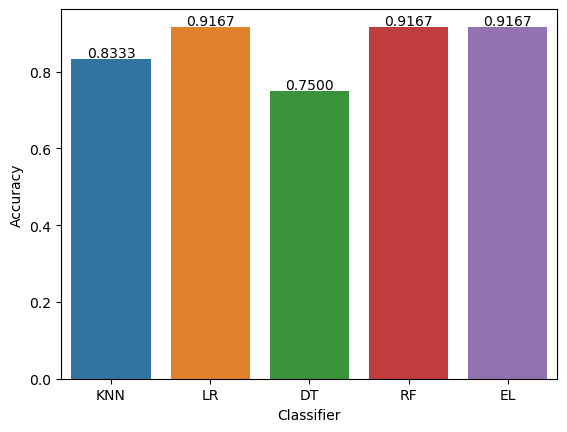

In [87]:
import seaborn as sns
axis = sns.barplot(x = 'Name', y = 'Score', data =tr_split )
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center") 
    
plt.show()

# Fire prediction Model

In [3]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('Fire prediction dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

Fire prediction dataset\amazon.csv


In [4]:
df = pd.read_csv('Fire prediction dataset/amazon.csv', encoding='latin1')
df.tail()

,year,state,month,number,date
6449,2012,Tocantins,Dezembro,128.0,2012-01-01
6450,2013,Tocantins,Dezembro,85.0,2013-01-01
6451,2014,Tocantins,Dezembro,223.0,2014-01-01
6452,2015,Tocantins,Dezembro,373.0,2015-01-01
6453,2016,Tocantins,Dezembro,119.0,2016-01-01


Here we can see the data available to analysis. Let's drop the 'date' column, as we can have that information about year and month in their own columns.

In [5]:
df.drop('date', axis=1, inplace=True)
df.tail()

,year,state,month,number
6449,2012,Tocantins,Dezembro,128.0
6450,2013,Tocantins,Dezembro,85.0
6451,2014,Tocantins,Dezembro,223.0
6452,2015,Tocantins,Dezembro,373.0
6453,2016,Tocantins,Dezembro,119.0


We should change the month names to english.

In [6]:
df.month.replace('Janeiro', 'January',inplace=True)
df.month.replace('Fevereiro','February',inplace=True)
df.month.replace('Março','March',inplace=True)
df.month.replace('Abril','April',inplace=True)
df.month.replace('Maio','May',inplace=True)
df.month.replace('Junho','June',inplace=True)
df.month.replace('Julho','July',inplace=True)
df.month.replace('Agosto','August',inplace=True)
df.month.replace('Setembro','September',inplace=True)
df.month.replace('Outubro','October',inplace=True)
df.month.replace('Novembro','November',inplace=True)
df.month.replace('Dezembro','December',inplace=True)
df.tail()

,year,state,month,number
6449,2012,Tocantins,December,128.0
6450,2013,Tocantins,December,85.0
6451,2014,Tocantins,December,223.0
6452,2015,Tocantins,December,373.0
6453,2016,Tocantins,December,119.0


Below, we can see the statiscal information about the reported number of fires

In [7]:
df['number'].describe()

count    6454.000000
mean      108.293163
std       190.812242
min         0.000000
25%         3.000000
50%        24.000000
75%       113.000000
max       998.000000
Name: number, dtype: float64

Although the mean number of reported fires is relatively low, the standard deviation is quite high. Suggesting that it changes over time. 


As we can see, the max number of fires is 998. Let's discover where and when it happened.

In [8]:
print('Max number of registered fires in a month: ',df['number'].max())
print('State: ',df[df['number'] ==  df['number'].max()]['state'].iloc[0])
print('Year: ',df[df['number'] ==  df['number'].max()]['year'].iloc[0])
print('Month: ',df[df['number'] ==  df['number'].max()]['month'].iloc[0])

Max number of registered fires in a month:  998.0
State:  Amazonas
Year:  2008
Month:  September


It happened in the state of Amazonas. As we know, the state of Amazonas contains a large area of the amazon rainforest, therefore, is not surprise that the max number of fires has been reported in that state.

We now analyse which months are worst using some basic statistics. We will define these months as the ones that have a reported number of fires higher than mean + standard deviation of the total number of fires.

Worst months: 
August
July
November
October


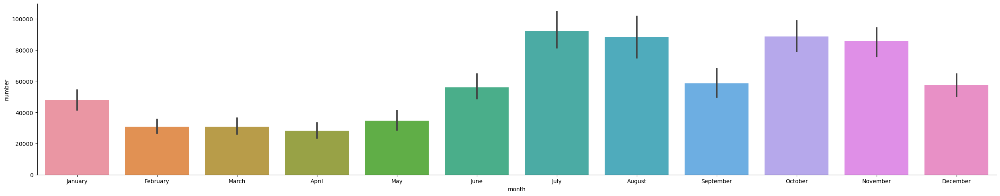

In [99]:
# Grouping by month and summing the values
monthly_sum_fire = df.groupby(['month'], as_index=False).sum() 

# Dropping the 'year' column
monthly_sum_fire.drop('year', axis=1, inplace=True)

# Identifying the worst months where the number is greater than the mean plus one standard deviation
worst_months = monthly_sum_fire[monthly_sum_fire['number'] > monthly_sum_fire['number'].mean() + monthly_sum_fire['number'].std()]

# Printing the worst months
print('Worst months: ')
for i in range(len(worst_months)):
    print(worst_months['month'].values[i])

# Plotting a bar chart for the monthly fire data, using the sum of 'number' by 'month'
sns.catplot(x='month', y='number', kind='bar', data=df[['month', 'number']], aspect=5, estimator=sum)


Our statistical approach seems to work fine, since it is in accordance to the higher values of reported fire, therefore, filtering the lesser critical months.

Using the same approach, we define the states that are more affected by fire.

Worst states: 
Mato Grosso
Paraiba
Sao Paulo


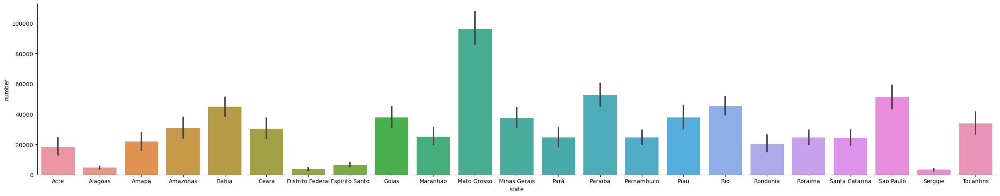

In [100]:
# Grouping by state and summing the values
statewise_sum_fire = df.groupby(['state'], as_index=False).sum()

# Dropping the 'year' column
statewise_sum_fire.drop('year', axis=1, inplace=True)

# Plotting a bar chart for the fire data by state, using the sum of 'number' by 'state'
sns.catplot(x='state', y='number', data=df[['state', 'number']], kind='bar', aspect=5, estimator=sum)

# Identifying the worst states where the number is greater than the mean plus one standard deviation
worst_states = statewise_sum_fire[statewise_sum_fire['number'] > statewise_sum_fire['number'].mean() + statewise_sum_fire['number'].std()]

# Printing the worst states
print('Worst states: ')
for i in range(len(worst_states)):
    print(worst_states['state'].values[i])


Curiously, the state of Amazonia is not included in the list. Maybe the first information about Amazonia that we found is a "outlier" of the occurances in the state, and is not a good representation of what actually happens there.

At last, we see how the reported number of fires has changed over the years. We use the same statistical approach to define the worst ones.

Worst years: 
2003
2015
2016


<Axes: title={'center': 'Registered number of fires per year (sum of all entries)'}, xlabel='year', ylabel='number'>

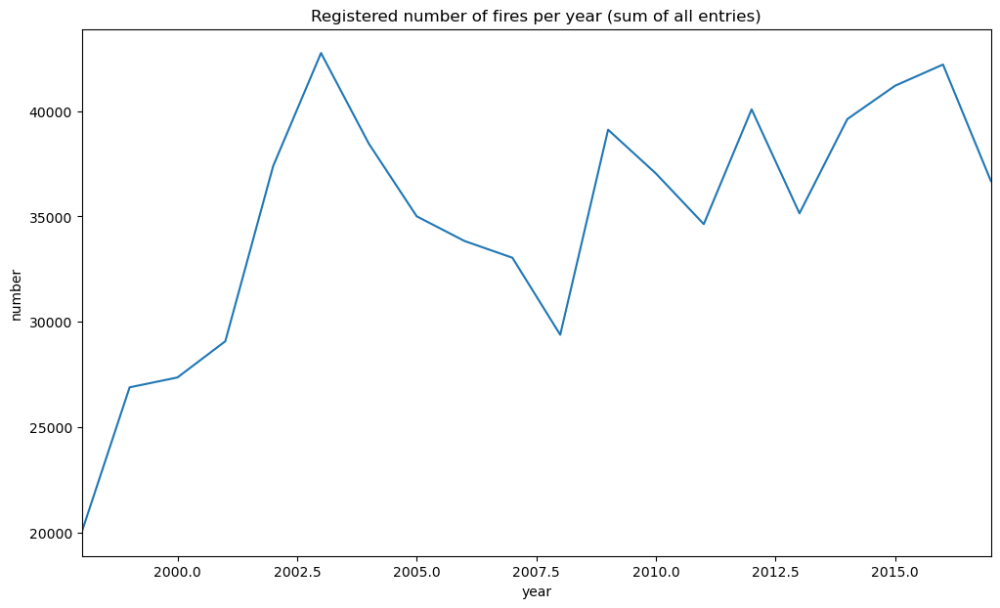

In [101]:
# Grouping data by 'year' and summing the values
fire_sum_by_year = df.groupby(['year'], as_index=False).sum()

# Identifying the worst years (those above the mean + standard deviation)
worst_years = fire_sum_by_year[fire_sum_by_year['number'] > fire_sum_by_year['number'].mean() + fire_sum_by_year['number'].std()]
print('Worst years: ')
for i in range(len(worst_years)):
    print(worst_years['year'].values[i])

# Plotting the data
plt.figure(figsize=[12,7])
plt.xlim([1998, 2017])
plt.title('Registered number of fires per year (sum of all entries)')
sns.lineplot(x='year', y='number', data=fire_sum_by_year)


We can see a that the reported number of fires increased in a very fast rhythm until 2003, then it started to fall. But since 2008, this number started to increase again.

Let's see if can predict the number of fires in the incoming years using the data available.

Analysing the data, seems reasonable to fit it into a third degree polynomial function.

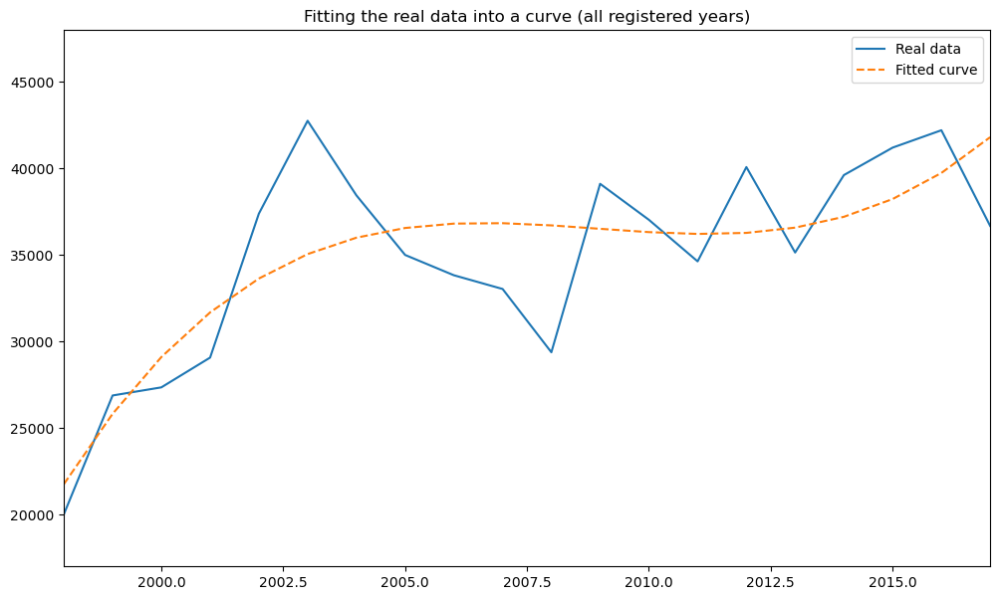

In [102]:
# Fitting a cubic polynomial to the data
poly = np.polyfit(fire_sum_by_year['year'], fire_sum_by_year['number'], 3)
z = np.poly1d(poly)

# Generating a range of years for the fitted curve
years = np.linspace(1998, 2017, 20)

# Plotting the real data and the fitted curve
plt.figure(figsize=[12,7])
plt.plot(years, fire_sum_by_year['number'], '-', label='Real data') 
plt.plot(years, z(years), '--', label='Fitted curve')
plt.xlim([1998, 2017])
plt.ylim([17000, 48000])
plt.title('Fitting the real data into a curve (all registered years)')
plt.legend()
plt.show()


Predicting the number of fires:

In [103]:
for i in range(2019,2024,1):
    print(i, '->', math.trunc(z(i)))

2019 -> 47933
2020 -> 52148
2021 -> 57237
2022 -> 63279
2023 -> 70352


It is not very optimistic, is it? The third degree polynomial seems to be a bit aggresive, maybe, due to the earlier years of the data set and it fast increase. Let's use only the data after 2006, and fit it into a first degree polynomial function.

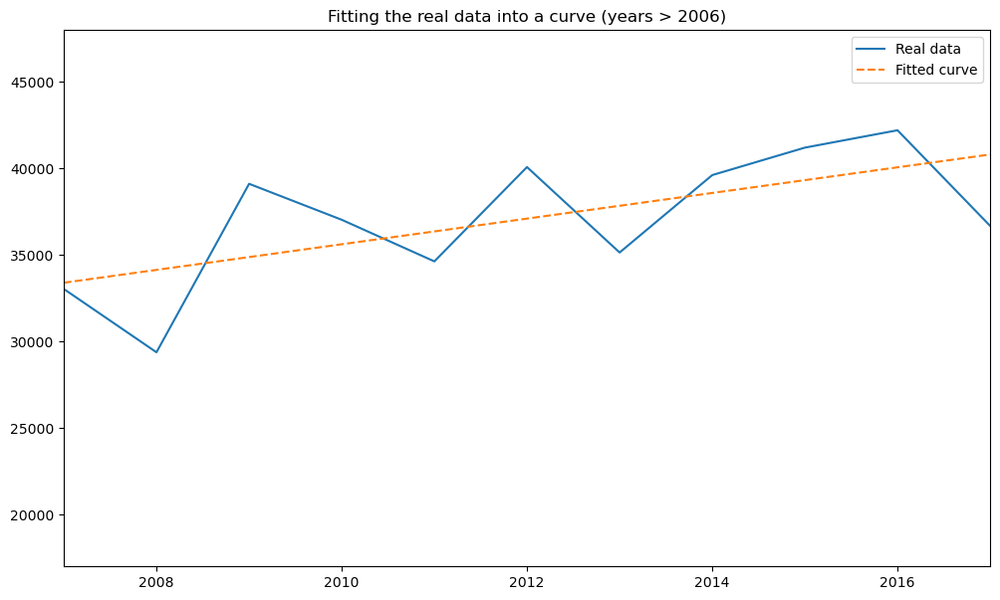

In [104]:
# Filtering the data for years greater than 2006
new_model = fire_sum_by_year[fire_sum_by_year['year'] > 2006]

# Fitting a linear polynomial to the filtered data
poly = np.polyfit(new_model['year'], new_model['number'], 1)
z = np.poly1d(poly)

# Generating a range of years from 2007 to 2017 for the fitted curve
years = np.linspace(2007, 2017, 11)

# Plotting the real data and the fitted curve
plt.figure(figsize=[12,7])
plt.plot(years, new_model['number'], '-', label='Real data') 
plt.plot(years, z(years), '--', label='Fitted curve')
plt.xlim([2007, 2017])
plt.ylim([17000, 48000])
plt.title('Fitting the real data into a curve (years > 2006)')
plt.legend()
plt.show()


The new prediction:

In [106]:
for i in range(2019,2024,1):
    print(i, '->', math.trunc(z(i)))

2019 -> 42293
2020 -> 43034
2021 -> 43776
2022 -> 44517
2023 -> 45258


We can say that we achieved not so aggressive results. But, as we know, since the beginning of 2019 the number of fires in the amazon rainforest has increased again. Therefore, our model to predict the number of fires in the incoming years seems to be correct, unfortunately.